In [1]:
%%time
# Импортирую библиотеки и готовлю функции
import math
from scipy import stats as st
import numpy as np
import pandas as pd
#отключаю предупреждения
pd.options.mode.chained_assignment = None
import os
# from zipfile import ZipFile #https://metanit.com/python/tutorial/4.7.php
# import zipfile
import warnings
import datetime
import time
from tqdm import tqdm
from tqdm import notebook
tqdm.pandas()
from PIL import Image
from pathlib import Path
# Помогаторные функции
def кп(текст): #красный подчеркнутый
    return f"\033[31m\033[4m{текст}\033[0m"
def сп(текст): #синий подчеркнутый
    return f"\033[34m\033[4m{текст}\033[0m"
def з(текст): #синий подчеркнутый
    return f"\033[32m{текст}\033[0m"
pd.set_option('display.float_format', '{:.2f}'.format)
def print_df(df):
    pd.set_option('display.max_rows', None)
    display(df)
    pd.set_option('display.max_rows', 2)


def t():
    return datetime.datetime.now()

import random
def цвет():
    return f'rgb({random.randrange(255)},{random.randrange(255)},{random.randrange(255)})'

def info_df(df):
    print(f'запуск проверки {сп(t())}, на моент запуска {сп(len(df))} строк')
    дубликатов = df.duplicated().sum()
    if дубликатов >= 1:
        print(кп('Найдены дубликаты:'))
        print(df.value_counts())
        print(f'Нужно удалить {кп(дубликатов)} дублей')
    строк = df.reset_index()['index'].count()
    print(з(df.info()))
    print_df(df.describe())
    if строк>3:
        display(df.sample(3))
    else:
        print(f"Набор данных содержит {кп(строк)} строк. Вывожу весь набор данных")
        display(df.sample(строк))

# Визуализация графиков
import seaborn as sns
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import rcParams, rcParamsDefault
from pandas.plotting import scatter_matrix
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

политра = ['rgb(55, 83, 109)', 'rgb(26, 118, 255)']
[политра.append(цвет()) for color in range(0, 23)]


def update_layout(fig, bub=0, наименование=None, xlabel=None, ylabel=None):
    '''
    функция описания вывода графика
    '''
    if bub==1:
        return fig.update_layout(
            title=наименование
            , xaxis_tickfont_size=14
            , yaxis=dict(
                titlefont_size=16
                ,tickfont_size=14
                ,title=ylabel
            )
            , xaxis=dict(
                titlefont_size=16
                ,tickfont_size=14
                ,title=xlabel )
            , legend=dict(
                x=1
                , y=1.02
                ,bgcolor='rgba(255, 255, 255, 0)'
                ,bordercolor='rgba(255, 255, 255, 0)'
                , orientation="h"
            , yanchor="bottom"
            , xanchor="right"
            )
            , barmode='group'
            , bargap=0.2 # промежуток между столбцами соседних координат местоположения
            , bargroupgap=0.05 # промежуток между стержнями с одинаковыми координатами расположения
    )
    else:
        return fig.update_layout(
            title=наименование
            , legend=dict(
                x=0.9
                ,y=1.0
                ,bgcolor='rgba(255, 255, 255, 0)'
                ,bordercolor='rgba(255, 255, 255, 0)'
            )
            , barmode='group'
            , bargap=0.2 # промежуток между столбцами соседних координат местоположения
            , bargroupgap=0.05 # промежуток между стержнями с одинаковыми координатами расположения
    )

def столбчатый1ось(x, y, наименование=None, xlabel=None, ylabel=None):
    '''
    Столбчатый график для одного признака
    '''
    fig = go.Figure()    
    fig.add_trace(go.Bar(
        x=x
        , y = y
        , marker_color=политра[0]
                ))    
    fig.update_layout(
        title=наименование
        , xaxis_tickfont_size=14
        , yaxis=dict(
            titlefont_size=16
            ,tickfont_size=14
            ,title=ylabel
        )
        , xaxis=dict(
            titlefont_size=16
            ,tickfont_size=14
            ,title=xlabel )
        , legend=dict(
            x=0.9
            ,y=1.0
            ,bgcolor='rgba(255, 255, 255, 0)'
            ,bordercolor='rgba(255, 255, 255, 0)'
        )
        , barmode='group'
        , bargap=0.2 # промежуток между столбцами соседних координат местоположения
        , bargroupgap=0.05 # промежуток между стержнями с одинаковыми координатами расположения
)
    fig.show()


def план_факт(план, факт, наименование_модели=None):
    '''
    Построение графика для отображения плана и факта, где под планом предполагается спрогнозированное значение,
    а под фактом целевое. Выполнение плана рассчитывается как отношение факта к плану.
    Таймфрейм - строковое значение, зависит от индекса, если индекс дата. Может быть для дня 1D, для 10 минут 10MIN,
    для годов 1Y и т.п.
    '''
    yy = [r for r in range(len(факт))]
    выполнение_плана=[план[r]/факт[r] for r in range(len(факт))]
    
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.add_trace(go.Bar(
            x=yy
            , y = план
            , name='предсказание'
            , marker_color=политра[1]
                    )
            , secondary_y=False,)
    fig.add_trace(go.Bar(
            x=yy
            , y = факт
            , name='факт'
            , marker_color=политра[0]
                    )
            , secondary_y=False,)
    fig.add_trace(
        go.Scatter(
            x=yy
            , y=выполнение_плана
            , name="точность"),
        secondary_y=True,
        )
    
    fig.update_layout(
        title=наименование_модели
        , xaxis_tickfont_size=14
        , yaxis=dict(
            titlefont_size=16
            ,tickfont_size=14
        )
        , legend=dict(
            x=1
            ,y=1.02
            ,bgcolor='rgba(255, 255, 255, 0)'
            ,bordercolor='rgba(255, 255, 255, 0)'
            , orientation="h"
            , yanchor="bottom"
            , xanchor="right"
        )
        , barmode='group'
        , bargap=0.2 # промежуток между столбцами соседних координат местоположения
        , bargroupgap=0.05 # промежуток между стержнями с одинаковыми координатами расположения
)
    # Set x-axis title
    # fig.update_xaxes(title_text="дата")

    # Set y-axes titles
#     fig.update_yaxes(title_text="<b>primary</b> ", secondary_y=False)
    fig.update_yaxes(title_text="Точность", secondary_y=True)
    fig.show()



print('done')

rs = 12345

done
CPU times: total: 1.89 s
Wall time: 2.43 s


# Прекод

<!-- # Сборный проект-4 -->

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

# Исследовательский анализ данных
## Распаковка данных

In [2]:

# Директория расположения файла
# D:\не для майкрософта\Обучения\yandex\Машинное обучение\проект4\to_upload
# путь = r'D:/не для майкрософта/Обучения/yandex/Машинное обучение/проект4/dsplus_integrated_project_4.zip'
PATH = r'D:/не для майкрософта/Обучения/yandex/Машинное обучение/проект4/to_upload'
PATH

'D:/не для майкрософта/Обучения/yandex/Машинное обучение/проект4/to_upload'

In [3]:
# Распакую данные

train_data = pd.read_csv(
    os.path
    .join(PATH, 'train_dataset.csv'))
train_data.name = 'train_data'

data_crowd = pd.read_csv(
    os.path
    .join(PATH, 'CrowdAnnotations.tsv')
    , sep='\t'
    , names = ['image', 'query_id', 'fraction', 'pros', 'cons'])
data_crowd.name = 'data_crowd'

data_experts = pd.read_csv(
    os.path
    .join(PATH, 'ExpertAnnotations.tsv')
    , sep='\t'
    , names = ['image', 'query_id', 'first', 'second', 'third'])
data_experts.name = 'data_expert'

test_query = pd.read_csv(
    os.path
    .join(PATH, 'test_queries.csv')
    , index_col=[0]
    , sep='|')
test_query.name = 'test_query'

test_image = pd.read_csv(
    os.path
    .join(PATH, 'test_images.csv')
)#<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
test_image.name = 'test_image'


## Ознакомление с даннымиования модели.

In [4]:
список_данных = {'train_data':train_data, 'data_crowd':data_crowd, 'data_expert':data_experts, 'test_query':test_query, 'test_image':test_image}
описание_краткое = {
    'train_data':'содержит информацию необходимую для обучения'
    , 'data_crowd':'содержит информацию по соответствию изображения и описания, полученные с помощью краудсорсинга'
    , 'data_expert':'содержит информацию по соответствию изображения и описания, полученные в результате опроса экспертов'
    , 'test_query':'содержит информацию необходимую для тестирования'
    , 'test_image':'содержит изображения для тестирования модели'
}
for df in список_данных:
    print()
    print()
    print(f'Рассмотрим набор данных {сп(df)}')
    print(з(f'{описание_краткое[df]}'))
    print()
    info_df(список_данных[df])
    print(з('='*100))
    print()



Рассмотрим набор данных train_data
содержит информацию необходимую для обучения

запуск проверки 2024-11-01 18:52:39.874434, на моент запуска 5822 строк
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None


,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


,image,query_id,query_text
5109,3162045919_c2decbb69b.jpg,2901880865_3fd7b66a45.jpg#2,A surfer is jumping a wave .
...,...,...,...
345,3116769029_f5a76f04ba.jpg,2894217628_f1a4153dca.jpg#2,The football player wearing a white helmet and...





Рассмотрим набор данных data_crowd
содержит информацию по соответствию изображения и описания, полученные с помощью краудсорсинга

запуск проверки 2024-11-01 18:52:39.901952, на моент запуска 47830 строк
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   fraction  47830 non-null  float64
 3   pros      47830 non-null  int64  
 4   cons      47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None


,fraction,pros,cons
count,47830.00,47830.00,47830.00
mean,0.07,0.21,2.82
std,0.21,0.63,0.66
min,0.00,0.00,0.00
25%,0.00,0.00,3.00
50%,0.00,0.00,3.00
75%,0.00,0.00,3.00
max,1.00,5.00,6.00


,image,query_id,fraction,pros,cons
16047,2654514044_a70a6e2c21.jpg,2723477522_d89f5ac62b.jpg#2,0.33,1,2
...,...,...,...,...,...
17016,270816949_ffad112278.jpg,3502343542_f9b46688e5.jpg#2,0.00,0,3





Рассмотрим набор данных data_expert
содержит информацию по соответствию изображения и описания, полученные в результате опроса экспертов

запуск проверки 2024-11-01 18:52:39.942843, на моент запуска 5822 строк
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
None


,first,second,third
count,5822.00,5822.00,5822.00
mean,1.44,1.62,1.88
std,0.79,0.86,0.90
min,1.00,1.00,1.00
25%,1.00,1.00,1.00
50%,1.00,1.00,2.00
75%,2.00,2.00,2.00
max,4.00,4.00,4.00


,image,query_id,first,second,third
575,180094434_b0f244832d.jpg,3155390408_8e1a81efb2.jpg#2,1,1,1
...,...,...,...,...,...
5553,540721368_12ac732c6c.jpg,2968182121_b3b491df85.jpg#2,1,1,1





Рассмотрим набор данных test_query
содержит информацию необходимую для тестирования

запуск проверки 2024-11-01 18:52:39.965782, на моент запуска 500 строк
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
None


,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
freq,1,1,5


,query_id,query_text,image
29,1468389504_c724bdcad0.jpg#4,two young girls wearing pink outfits playing o...,1468389504_c724bdcad0.jpg
...,...,...,...
224,3089107423_81a24eaf18.jpg#4,The man in the black shirt is pointing his cam...,3089107423_81a24eaf18.jpg





Рассмотрим набор данных test_image
содержит изображения для тестирования модели

запуск проверки 2024-11-01 18:52:39.985730, на моент запуска 100 строк
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
None


,image
count,100
unique,100
top,3356748019_2251399314.jpg
freq,1


,image
98,2670637584_d96efb8afa.jpg
...,...
77,973827791_467d83986e.jpg


In [5]:
def f2():
   for df in список_данных:
       print(f'набор данных: {сп(df)}, {з(описание_краткое[df])}')
       display(список_данных[df].sample(1))
       print(з('='*100))

**Количество уникальных изображений**

In [6]:
print('Обучающий набор:', train_data.image.nunique())
print('Тестовый набор:', test_query.image.nunique())

Обучающий набор: 1000
Тестовый набор: 100


**Количество уникальных описаний**

In [7]:
print('Обучающий набор:', train_data.query_text.nunique())
print('Тестовый набор:', test_query.query_text.nunique())

Обучающий набор: 977
Тестовый набор: 500


## Изучу оценки

**Количество оценок**, т.е. уникальных запросов (query_id)

In [8]:
print('после опроса экспертов:', data_experts.query_id.nunique())
print('разметка краудсорсинга:', data_crowd.query_id.nunique())

после опроса экспертов: 977
разметка краудсорсинга: 1000


У экспертов уникальное количество размеченных оценок меньше, чем у краудсорсинга. Однако у экспертов предположительно качество должно быть выше.
<br> Рассмотрю долю людей, подтвердивших, что описание соответсвует изобращению.

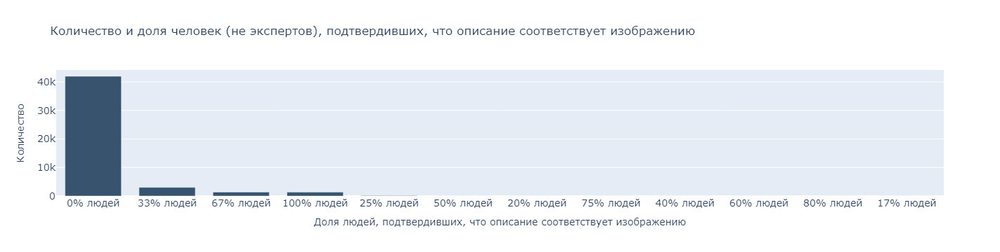

In [9]:
itui = data_crowd.groupby(['fraction']).agg({'image':'count'}).reset_index().sort_values(by='image', ascending=False)
itui['lable'] = round(itui.fraction*100).astype('int').astype('str')+'% людей'
# print_df(itui)
столбчатый1ось(
    itui.lable
    , itui.image
    , наименование='Количество и доля человек (не экспертов), подтвердивших, что описание соответствует изображению'
    , xlabel='Доля людей, подтвердивших, что описание соответствует изображению'
    , ylabel='Количество')

В большинстве случаев 0% людей подтверждают, что описание соответствует изображению. Это означает, что разметка не экспертов не всегда может быть применима.
<br>**Нормализация оценки экспертов**
<br>Использую медианную оценку экспертов для учета агрегированной оценки. С помощью масштабирования ($min-max$) привожу цулувую оценку в диапазон от 0 до 1.

,image,query_id,first,second,third,total,norm
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1,0.00
...,...,...,...,...,...,...,...
5821,997722733_0cb5439472.jpg,486917990_72bd4069af.jpg#2,3,3,3,3,0.67


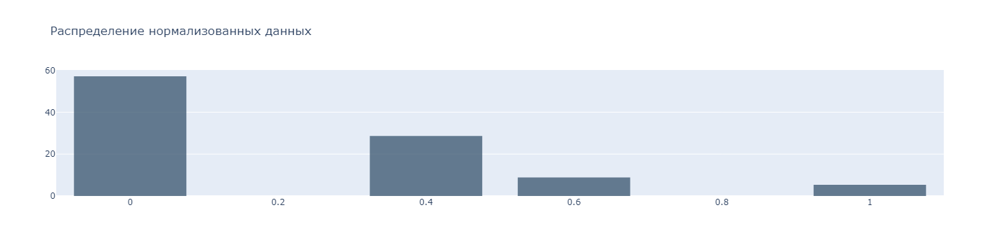

In [10]:
data_expert = data_experts.copy()
data_expert['total'] = (data_expert[['first', 'second', 'third']]).median(axis=1).astype('int')
# применяю нормализацию
data_expert['norm'] = (data_expert['total'] - data_expert['total'].min()) / (data_expert['total'].max() - data_expert['total'].min())
display(data_expert)
fig = go.Figure()
fig.add_trace(
    go.Histogram(
        x=data_expert.norm
        , histnorm='percent'
        , name='Нормализация оценки'
        , marker_color=политра[0]
        , opacity=0.75
) )
update_layout(fig, наименование='Распределение нормализованных данных', xlabel='Оценка', ylabel='Частота')
fig.show()

Большинство изображений в датасете не соответсвует описанию.
<br> Исходя из обзора данных, я стану использовать только экспертные оценки, так как экспертные данные должны иметь лучшее качество, недостатком является количество размеченных данных.
<br> Сформирую набор данных для обучения

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5822 non-null   object 
 1   query_id  5822 non-null   object 
 2   target    5822 non-null   float64
dtypes: float64(1), object(2)
memory usage: 136.6+ KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 977 entries, 0 to 5821
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    977 non-null    object
 1   query_text  977 non-null    object
dtypes: object(2)
memory usage: 22.9+ KB
None


,image,query_id,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.00
...,...,...,...
5821,968081289_cdba83ce2e.jpg,2292406847_f366350600.jpg#2,0.00


Проверка на дубли


image       0
query_id    0
target      0
dtype: int64

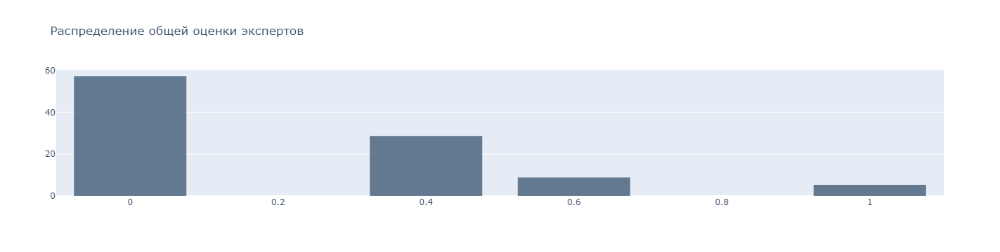

In [11]:
training_data = (
    train_data.merge(
        data_expert[['image', 'query_id', 'norm']]
        .rename({'norm':'target'}, axis=1) #целевой показатель
        , how='inner'
        , on=['image', 'query_id'])
)
# Выведу тексты в отдельный набор данных, чтобы облегчить работу с фреймими
query_id_text_corresp = training_data[['query_id', 'query_text']].drop_duplicates()
training_data = training_data.drop(columns=['query_text'])

print(training_data.info())
print(query_id_text_corresp.info())
display(training_data)

print('Проверка на дубли')
print_df(training_data.isnull().sum())

fig = go.Figure()
fig.add_trace(
    go.Histogram(
        x=training_data.target
        , histnorm='percent'
        , name='Нормализация оценки'
        , marker_color=политра[0]
        , opacity=0.75
) )
update_layout(fig, наименование='Распределение общей оценки экспертов', xlabel='Оценка', ylabel='Частота')
fig.show()

`training_data` состоит из 5822 объектов и 3 атрибутов. Пропуски в данных отсутствуют. Сформировал таблицу `query_id_text_corresp` с уникальными текстами, по `query_id` будет легко востановить текст. Дубли в тренировачном наборе данных отсутствуют.
## Соответсвие изображений и описаний в отчищенном наборе данных
### Загрузка библиотек для просмотра изображений

In [12]:
from textwrap import wrap
import matplotlib.image as mpimg
def show_images(df):
    '''
    Функция выводит изображения из переданного ей DF
    '''
    fig = plt.figure(figsize=(10,10))
    for i in range(9):
        fig.add_subplot(3, 3, i+1)
        img_name = df.iloc[i]['image']
        img_text = df.iloc[i]['query_text']
        img_text = '\n'.join(wrap(img_text, 40))
        img_target = df.iloc[i]['target']
        img = mpimg.imread(f'{PATH}/train_images/{img_name}')
        plt.imshow(img)
        plt.title(f'prob={round(img_target, 2)}')
        plt.xlabel(img_text)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

### Случайная выборка изображений, соответствующих описанию

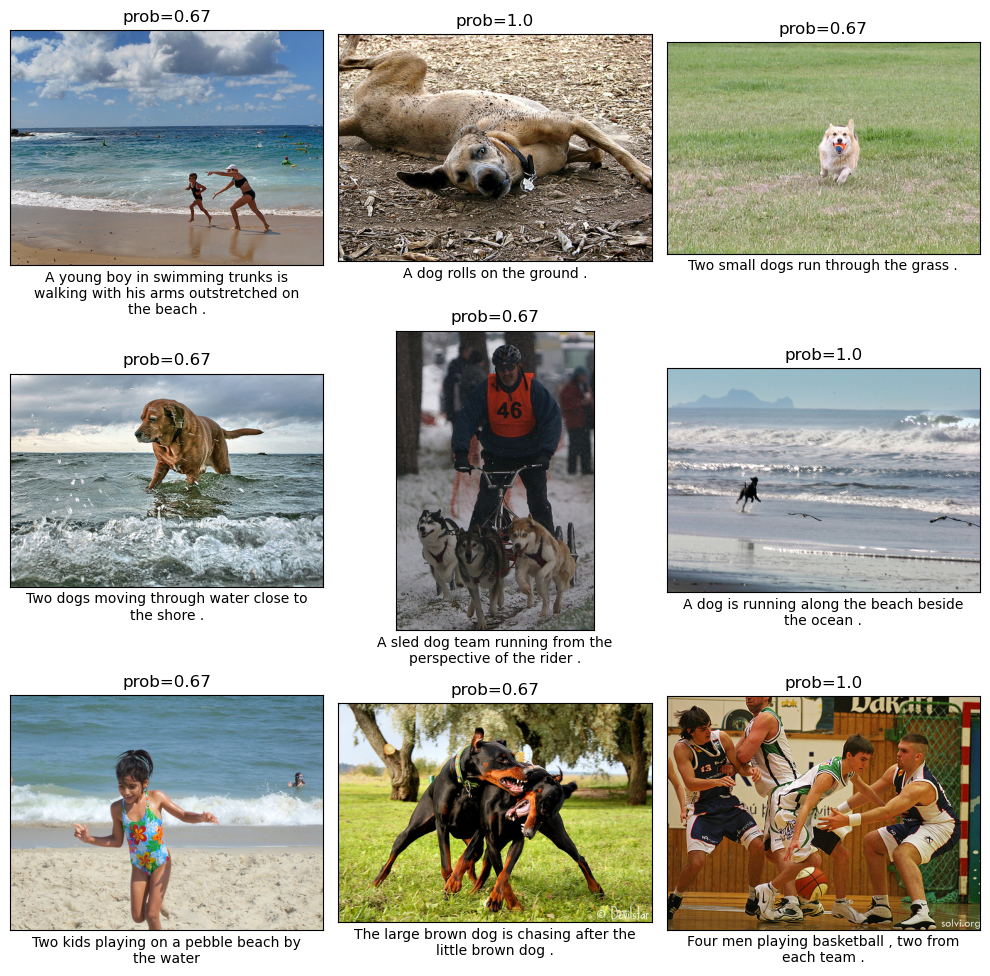

In [13]:
show_images(
    training_data
    .sample(n=2000, random_state=0)
    .query('target>0.5')
    .merge(query_id_text_corresp, on=['query_id'], how='inner')
)

### Случайная выборка изображений, не соответствующих описанию

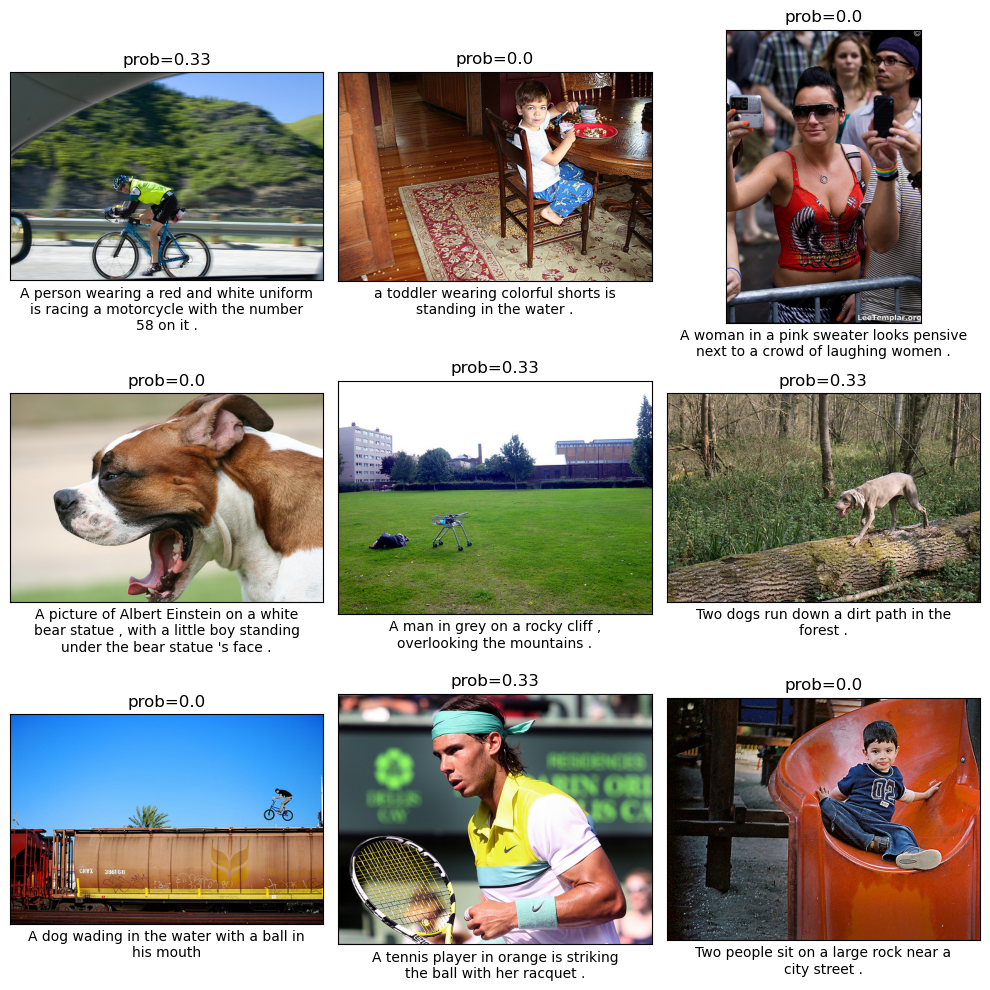

In [14]:
show_images(
    training_data
    .sample(n=2000, random_state=0)
    .query('target<0.5')
    .merge(query_id_text_corresp, on=['query_id'], how='inner')
)

## Выводы
В целом наборы данных представлены без дублей.
<br>В большинстве случаев в данных содержатся строковые поля, связываю это с тем, что наборы данных содержат описательную информацию о рассматриваемых объектах.
<br>**Загружены данные:** `train_dataset`, `test_queries`, `test_images`, `ExpertAnnotations`, `CrowdAnnotations`
<br>train_data содержит строк 5822
<br>data_crowd содержит строк 47830
<br>data_expert содержит строк 5822
<br>test_query содержит строк 500
<br>test_image содержит строк 100
<br>**Количество уникальных объектов в каждом датасете:**
- train_data изображения: 1000 из 5822
- test_query изображения: 100 из 500
- train_data текст: 977 из 5822
- test_query текст: 500 из 500
- data_expert описания: 977 из 5822
- data_crowd описания: 1000 из 47830

<br>На основании графиков определено что, большинство изображений не соответсвует описанию.
<br>**Обработка данных**:
<br>Нормализовал оценки экспертов;
<br>Подготовил новый набор данных для обучения моделей, который предполагает использование оценок экспертов.

# Подготовьте данные к обучению модели
## Работа с текстами
### Создайте список слов которые, по вашему мнению, могут попадать под юридические ограничения.текстов
Юридические ограничения
В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.
<br>В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:
<br>`⎢ This image is unavailable in your country in compliance with local laws.`
<br>Однако у вас в $PoC$ нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

In [15]:
WORD_TO_BLOCK = [
    'junior'
    , 'infants'
    , 'teen'
    , 'teenager'
    , 'kid'
    , 'infant'
    , 'boy'
    , 'boys'
    , 'youngster'
    , 'kids'
    , 'child'
    , 'children'
    , 'babies'
    , 'girl'
    , 'girls'
    , 'baby'
    , 'teens'
    , 'teenagers'
    , 'young'
    , 'toddler'
    , 'toddlers'
    , 'minor'
    , 'youth'
    ]

In [16]:
## функции для исключения описаний согласно юредическим ограничениям
def delete_stop_words(string, WORD_TO_BLOCK):
    lst = string.split() 
    if set(lst).intersection(WORD_TO_BLOCK):
        return np.nan
    else:
        return string
def find_stop_words_text(string, WORD_TO_BLOCK):
    if any(word in WORD_TO_BLOCK for word in string.split()):
        return string
    else:
        return np.nan

In [17]:
stop_comments = query_id_text_corresp.copy()
stop_comments['deleted_text'] = (stop_comments['query_text'].apply(lambda x: find_stop_words_text(x, WORD_TO_BLOCK))==stop_comments['query_text'].str.lower())
print(len(query_id_text_corresp)==len(stop_comments))
stop_comments

True


,query_id,query_text,deleted_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,False
...,...,...,...
5821,2292406847_f366350600.jpg#2,A man rows his boat below .,False


<!-- stop_comments = (
    stop_comments
    .merge(stop_comments
           .query_id.str.split('#', expand=True)
           , on=stop_comments.index, how='inner')
    .drop(0, axis=1)
    .rename({1:'deleted_images'}, axis=1)
)
stop_comments -->

### Исключите из обучающего датасета пары, которые, исходя из подготовленного вами списка слов, могут попадать под юридические ограничения.

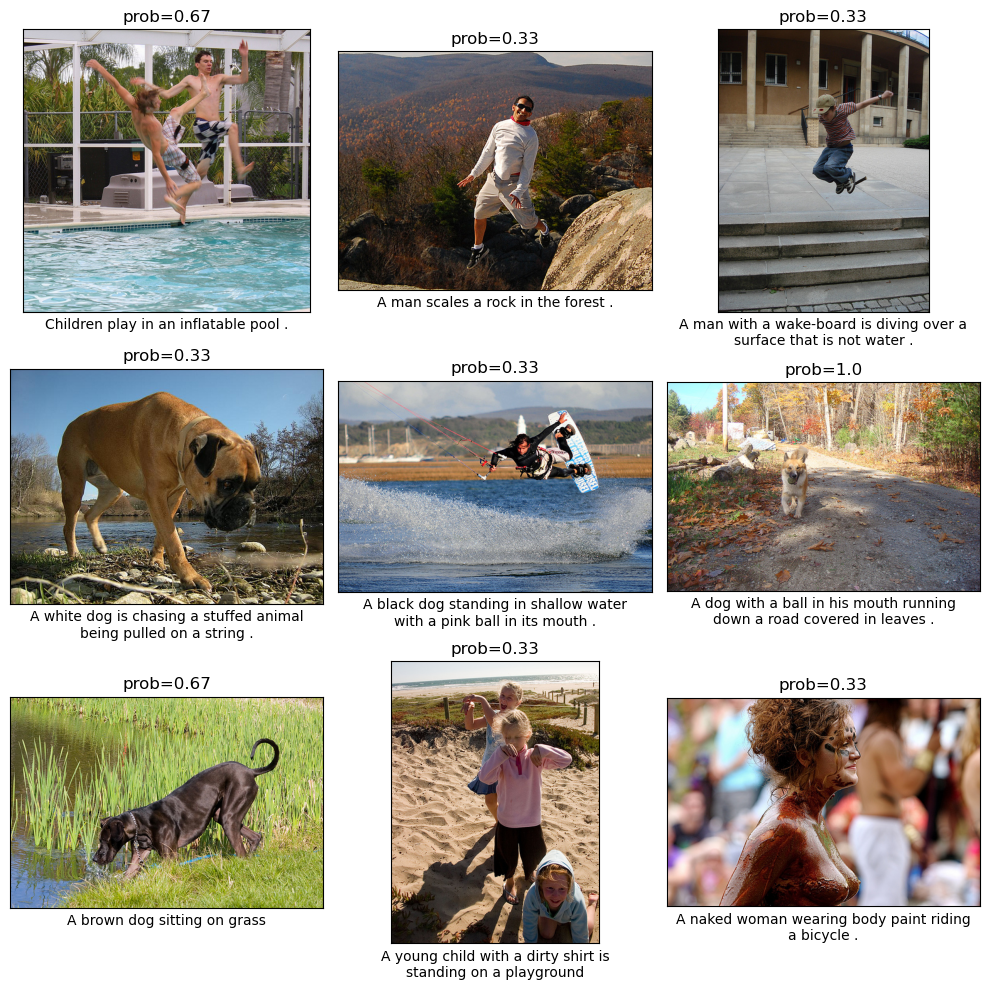

In [18]:
# Проверяю соответсвие изображений которые надо оставить
show_images(
    training_data
    .query('target>0.1')
    .sample(n=2000, random_state=0)
    .merge(
        stop_comments
        .query('deleted_text==False')
        , on=['query_id'], how='inner')
    )

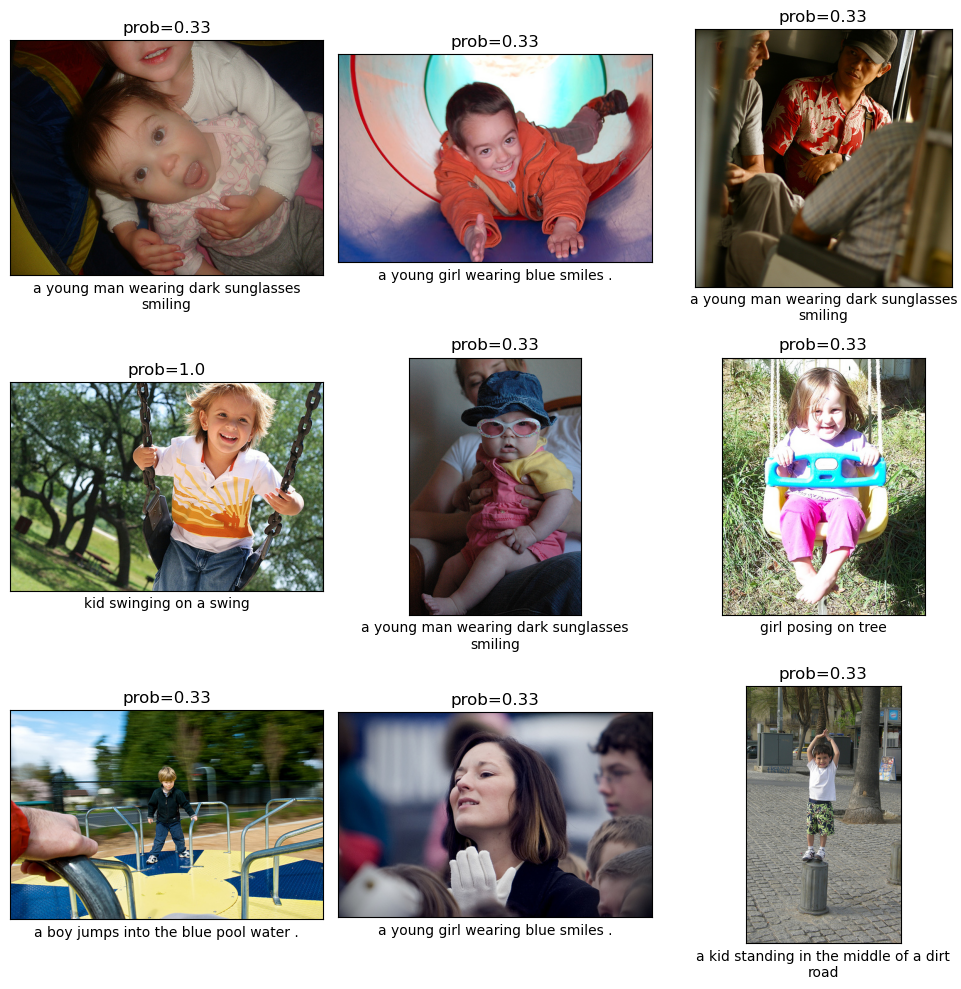

In [19]:
# Проверяю соответсвие изображений которые надо убрать
show_images(
    training_data
    .query('target>0.1')
    .sample(n=2000, random_state=0)
    .merge(
        stop_comments
        .query('deleted_text==True')
        , on=['query_id'], how='inner')
    )

В ходе изучения связи изображений, разметки экспертами и словами исключений, наблюдаю, что если оценка экспертов более 0.1, то более качественные данные получаем на выходе.

In [20]:
clean_training_data = training_data.query('target>0.1').merge(stop_comments.query('deleted_text==False'), on=['query_id'], how='inner').drop_duplicates() #.query_id
print(clean_training_data.info())
display(clean_training_data)
print(f'После удаления стоп слов осталось {len(clean_training_data)} строк ({round(len(clean_training_data)/len(training_data)*100, 2)}%)')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2427 entries, 0 to 2426
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         2427 non-null   object 
 1   query_id      2427 non-null   object 
 2   target        2427 non-null   float64
 3   query_text    2427 non-null   object 
 4   deleted_text  2427 non-null   bool   
dtypes: bool(1), float64(1), object(3)
memory usage: 78.3+ KB
None


,image,query_id,target,query_text,deleted_text
0,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,0.33,A young child is wearing blue goggles and sitt...,False
...,...,...,...,...,...
2426,929679367_ff8c7df2ee.jpg,3651971126_309e6a5e22.jpg#2,0.67,A blurry photo of two dogs .,False


После удаления стоп слов осталось 2427 строк (41.69%)


### Сделайте векторизацию текстового описания одним из следующих методов:
* TF-IDF;
* BERT;
* word2vec.

In [21]:
import torch
import torch.nn as nn
from torch import cuda
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset, TensorDataset
from PIL import Image
from torchvision import datasets, transforms, models
from torchmetrics import MeanSquaredError

import transformers
from tqdm import notebook

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)

DEVICE = torch.device("cuda") if torch.cuda.is_available() else torch.device('cpu')

In [22]:
def vectors_text(txt, batch_size=100):
    '''
    Функция vectors_text преобразоует тексты в векторы используя модель DistilBERT, библиотека Hugging Face Transformers.
    Embeddings из батчей объединяются в один набор данных.
    '''
    tokenizer = transformers.DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
    model = transformers.DistilBertModel.from_pretrained('distilbert-base-uncased')
    model.to(DEVICE)
    # Преобразуем текст в номера токенов из словаря
    # add_special_tokens=True Это значит, что к любому преобразуемому тексту добавляется токен начала (101) и токен конца текста (102)
    if type(txt)==str:
        txt = pd.Series(txt)
    tokenized = txt.apply(lambda x: tokenizer.encode(x, add_special_tokens=True, truncation=True))    
    max_len = 0
    for i in tokenized.values:
        if len(i) > max_len:
            max_len = len(i)
    padded = np.array([i + [0]*(max_len-len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)
    input_ids = torch.tensor(padded).to(DEVICE)
    attention_mask = torch.tensor(attention_mask).to(DEVICE)
    embeddings = []
    for i in range(input_ids.shape[0] // batch_size + 1):
        batch = input_ids[batch_size*i:batch_size*(i+1)]
        attention_mask_batch = attention_mask[batch_size*i:batch_size*(i+1)]
        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)
        embeddings.append(batch_embeddings[0][:,0,:].cpu().numpy())
        torch.cuda.empty_cache()
    features = np.concatenate(embeddings)
    return features

In [23]:
%%time
training_vectors_text = vectors_text(clean_training_data.query_text, 100)
training_vectors_text.shape

CPU times: total: 4min 9s
Wall time: 1min 5s


(2427, 768)

## Выводы
Функция `vectors_text` преобразоует тексты в векторы используя модель `DistilBERT`, библиотека `Hugging Face Transformers`.
<br>Embeddings из батчей объединяются в один набор данных.
<br>В рамках оптимизации векторезированы уникальные тексты.
<br>В ходе работы функции получен набор данных размером 2427, 768.
<!-- <br>В ходе работы функции получен набор данных размером 686, 768. -->
<!-- <br>В ходе работы функции получен набор данных размером 4256, 768. -->

## Работа с изображениями
### Сделайте векторизацию изображений с использованием модели ResNet50 из библиотеки Keras или PyTorch.

In [24]:
from keras.src.legacy.preprocessing.image import ImageDataGenerator
from keras.applications.resnet50 import preprocess_input

Found 2427 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

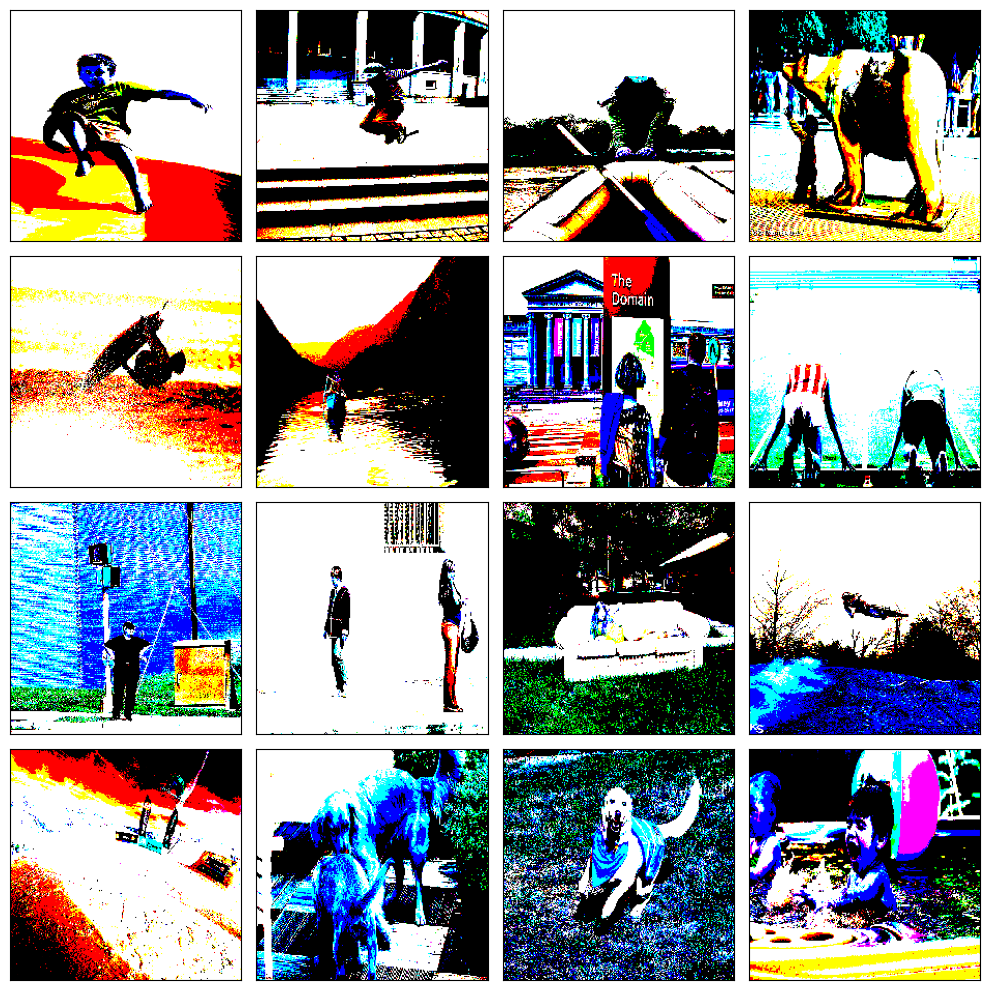

In [25]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)#(rescale=1./255)
train_gen_flow = train_datagen.flow_from_dataframe(
    dataframe=clean_training_data[['image', 'target']]
    , directory=Path(PATH, 'train_images')
    , x_col='image'
    , y_col='target'
    , target_size=(224, 224)
    , batch_size=16
    , class_mode='input'
    , seed=rs
    , shuffle=True
)

features, target = next(train_gen_flow)

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [26]:
from keras.applications.resnet import ResNet50
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout

In [27]:
# Для выделения главных компонентов изображений подготовлю свёрточную нейронную сеть
def create_a_model(input_shape):
    backbone = ResNet50(
        input_shape=input_shape
        , weights='imagenet'
        , include_top=False
    )
    optimizer = Adam(learning_rate=0.0001)
    # замораживаем ResNet50 без верхушки
    # Обучим только 1–2 полносвязных слоя наверху сети. Так количество параметров в сети уменьшится, но архитектура сохранится
    backbone.trainable = False
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    # model.add(Dense(12, activation='relu'))
    model.compile(
        optimizer=optimizer
        , loss='mean_squared_error'
        ,metrics=['mae']
    )
    # model.compile(optimizer=optimizer, loss='mean_squared_error',metrics=['mae'])
    return model

def image_vectorization(model, train_data):
    predictions = model.predict(train_data)
    return predictions

In [28]:
%%time
print(t())
inshape = (224, 224, 3)
training_vectors_img = image_vectorization(create_a_model(inshape), train_gen_flow)
training_vectors_img.shape

2024-11-01 18:54:04.253056
AttributeError: module 'ml_dtypes' has no attribute 'float8_e3m4'


C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



152/152 ━━━━━━━━━━━━━━━━━━━━ 175s 1s/step
CPU times: total: 17min 23s
Wall time: 2min 57s


(2427, 2048)

## Объединение векторов и выделение целевого признака

In [29]:
features = np.concatenate([training_vectors_img, training_vectors_text], axis=1)
features.shape

(2427, 2816)

In [30]:
target = clean_training_data.target.values
target.shape

(2427,)

### Дайте описание получившихся пар векторов с точки зрения их размерностей.
Результатом векторизации сформированы вектора размерностью 768 для текста и 2048 для изображения.
<br>2816 признаками представлено пространство для объекта в целом.
<br>2427 объектов всего.

## Обучение модели предсказания
Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. Данное предсказание можно решать с помощью задачи регрессии. Целевой метрикой будет `RMSE`, важно понять на скоько сильно отличается вероятность корректного описания картинки  от вычесленной в значении целевой переменной.
<br>Для того, чтобы изображения не попадали и в обучающую и в тестовую выборки воспользуюсь `GroupShuffleSplit`, находящийся в `sklearn.model_selection`.

In [31]:
from sklearn.model_selection import GroupShuffleSplit, train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler

In [32]:
gss = GroupShuffleSplit(n_splits=5, test_size=0.2, random_state=rs)
scaler = StandardScaler()

train, valid = next(gss.split(features, target, groups=clean_training_data["image"].values))

X_train = scaler.fit_transform(features[train])
y_train = target[train]
X_valid = scaler.transform(features[valid])
y_valid = target[valid]
print('Размерность тренировочной выборки:', з(X_train.shape))
print('Размерность валидационной выборки:', з(X_valid.shape))

Размерность тренировочной выборки: (1952, 2816)
Размерность валидационной выборки: (475, 2816)


### Baseline

In [33]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import roc_auc_score, mean_absolute_error, mean_squared_error

In [34]:
def графический_вывод(наименование, план, факт, rmse):
    план_факт(план, факт, f'{наименование} RMSE {round(rmse, 4)}')
    print_df(pd.DataFrame(line_predict).describe().T)
rmse_df = pd.DataFrame()

2024-11-01 18:57:02.954196


C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



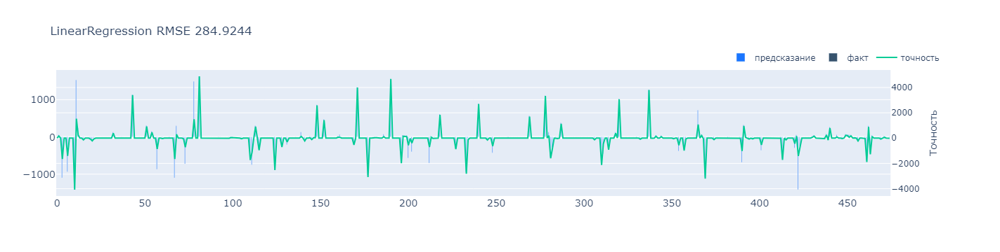

,count,mean,std,min,25%,50%,75%,max
0,475.00,-7.06,285.11,-1416.88,0.10,0.44,0.77,1628.13


CPU times: total: 10.8 s
Wall time: 3.11 s


In [35]:
%%time
print(з(t()))
line_model = LinearRegression()
line_model.fit(X_train, y_train)
line_predict = line_model.predict(X_valid)
rmse_line = mean_squared_error(y_valid, line_predict, squared=False)
графический_вывод('LinearRegression', line_predict, y_valid, rmse_line)
rmse_df = pd.concat([rmse_df, pd.DataFrame(data=[['LinearRegression', rmse_line]], columns=['model', 'rmse'])])

2024-11-01 18:57:06.069885


C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.828e-01, tolerance: 1.078e-02

C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



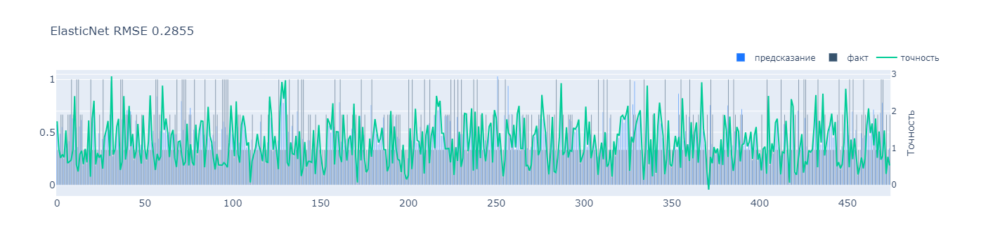

,count,mean,std,min,25%,50%,75%,max
0,475.00,-7.06,285.11,-1416.88,0.10,0.44,0.77,1628.13


CPU times: total: 2.8 s
Wall time: 2.11 s


In [36]:
%%time
print(з(t()))
ElasticNet_model = ElasticNet(alpha=0.001, random_state=rs)
ElasticNet_model.fit(X_train, y_train)
ElasticNet_predict = ElasticNet_model.predict(X_valid)
rmse_ElasticNet = mean_squared_error(y_valid, ElasticNet_predict, squared=False)
графический_вывод('ElasticNet', ElasticNet_predict, y_valid, rmse_ElasticNet)
rmse_df = pd.concat([rmse_df, pd.DataFrame(data=[['ElasticNet', rmse_ElasticNet]], columns=['model', 'rmse'])])

У `LinearRegression` очень плохой результат `RMSE` 1616, более лучший у `ElasticNet`, `RMSE` 0.2821. Результаты еще слишком далеки от идеальных, однако для сравнения других моделей продолжу использовать результат `ElasticNet`

### CatBoostRegressor

In [37]:
from catboost import CatBoostRegressor

2024-11-01 18:57:08.322875


C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


5 fits failed out of a total of 9.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\beree\anaconda3\Lib\site-packages\catboost\core.py", line 5873, in fit
    return self._fit(X, y, cat_features, text_features, embedding_features, None, graph, sample_weight, None, None, None, None, baseline,
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

{'depth': 3, 'iterations': 600}


C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



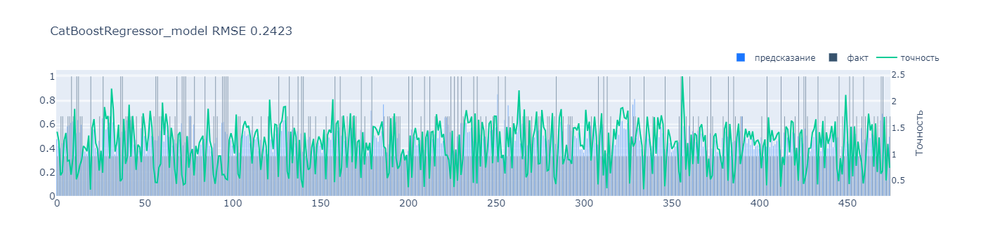

,count,mean,std,min,25%,50%,75%,max
0,475.00,-7.06,285.11,-1416.88,0.10,0.44,0.77,1628.13


RMSE CatBoostRegressor лучше чем RMSE ElasticNet
CPU times: total: 5min 29s
Wall time: 3min 33s


In [38]:
%%time
print(з(t()))
CatBoostRegressor_model = CatBoostRegressor(random_state = rs, verbose=False)
cbrm_grid = GridSearchCV(
    estimator=CatBoostRegressor_model
    , param_grid={'iterations': [600], 'depth': range(1, 4)}
    , cv=3
    , scoring='neg_root_mean_squared_error'
    , n_jobs=-1)
cbrm_grid.fit(X_train, y_train)
print(cbrm_grid.best_params_)
CatBoostRegressor_predict = cbrm_grid.predict(X_valid)
rmse_CatBoostRegressor_model = mean_squared_error(y_valid, CatBoostRegressor_predict, squared=False)
графический_вывод('CatBoostRegressor_model', CatBoostRegressor_predict, y_valid, rmse_CatBoostRegressor_model)
print(з('RMSE CatBoostRegressor лучше чем RMSE ElasticNet') if rmse_CatBoostRegressor_model<rmse_ElasticNet else кп('RMSE CatBoostRegressor хуже чем RMSE ElasticNet'))
rmse_df = pd.concat([rmse_df, pd.DataFrame(data=[['CatBoostRegressor', rmse_CatBoostRegressor_model]], columns=['model', 'rmse'])])

### Neural network

In [39]:
from keras.metrics import RootMeanSquaredError

In [40]:
%%time
print(з(t()))
# Функции активации https://keras.io/api/layers/activations/
# Преобразую данные в тензоры
train_tensor_x = torch.tensor(X_train, dtype=torch.float32)
train_tensor_y = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
valid_tensor_x = torch.tensor(X_valid, dtype=torch.float32)
valid_tensor_y = torch.tensor(y_valid, dtype=torch.float32).view(-1, 1)

in_shape = features.shape[1]
q = 1024
drop_out=[4, 8, 16, 32, 64]
optimizer = Adam(learning_rate=0.0001)

net_layers = Sequential()
net_layers.add(Dense(q, activation='relu', input_shape=(in_shape, )))
for i in range(1, 11):
    net_layers.add(BatchNormalization())
    q = int(q/2)
    if (i) % 2 == 0:
        activation_func = 'gelu'#https://arxiv.org/abs/1606.08415
    else:
        activation_func = 'hard_silu'#https://arxiv.org/abs/1905.02244
    if i in drop_out:
        net_layers.add(Dropout(0.2))
    net_layers.add(Dense(q, activation=activation_func))
net_layers.add(Flatten())
net_layers.add(Dense(1, activation='linear'))    



2024-11-01 19:00:41.536341


C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



CPU times: total: 1.19 s
Wall time: 524 ms


In [41]:
%%time
print(з(t()))
net_layers.compile(loss='mean_squared_error',
                optimizer = optimizer,
                metrics=[RootMeanSquaredError()])
net_layers.fit(
    train_tensor_x
    , train_tensor_y
    , epochs=100
    , batch_size=32
    , validation_data=(valid_tensor_x, valid_tensor_y)
    , validation_steps = math.ceil(train_tensor_x.shape[1]/32)
    , verbose=2
)


2024-11-01 19:00:42.078241
Epoch 1/100
61/61 - 13s - 213ms/step - loss: 1.6473 - root_mean_squared_error: 1.2835 - val_loss: 0.2283 - val_root_mean_squared_error: 0.4778
Epoch 2/100


C:\Users\beree\anaconda3\Lib\contextlib.py:158: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



61/61 - 3s - 48ms/step - loss: 1.5234 - root_mean_squared_error: 1.2343 - val_loss: 0.1944 - val_root_mean_squared_error: 0.4409
Epoch 3/100
61/61 - 3s - 48ms/step - loss: 1.4274 - root_mean_squared_error: 1.1947 - val_loss: 0.1956 - val_root_mean_squared_error: 0.4422
Epoch 4/100
61/61 - 3s - 46ms/step - loss: 1.3059 - root_mean_squared_error: 1.1428 - val_loss: 0.2380 - val_root_mean_squared_error: 0.4879
Epoch 5/100
61/61 - 3s - 44ms/step - loss: 1.2221 - root_mean_squared_error: 1.1055 - val_loss: 0.2598 - val_root_mean_squared_error: 0.5097
Epoch 6/100
61/61 - 3s - 49ms/step - loss: 1.1408 - root_mean_squared_error: 1.0681 - val_loss: 0.4030 - val_root_mean_squared_error: 0.6348
Epoch 7/100
61/61 - 3s - 49ms/step - loss: 1.0501 - root_mean_squared_error: 1.0247 - val_loss: 0.4789 - val_root_mean_squared_error: 0.6920
Epoch 8/100
61/61 - 3s - 46ms/step - loss: 0.9862 - root_mean_squared_error: 0.9931 - val_loss: 0.4100 - val_root_mean_squared_error: 0.6403
Epoch 9/100
61/61 - 3s - 

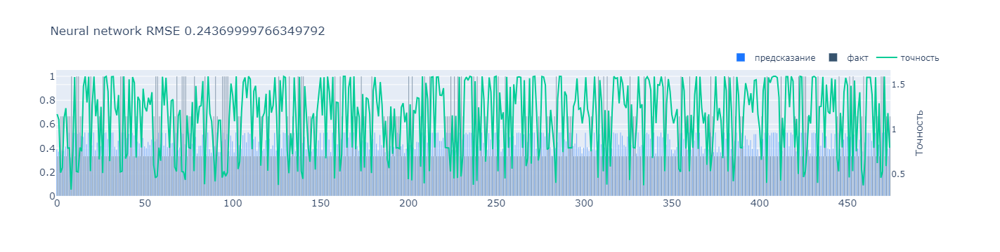

,count,mean,std,min,25%,50%,75%,max
0,475.00,-7.06,285.11,-1416.88,0.10,0.44,0.77,1628.13


RMSE Neural network лучше чем RMSE ElasticNet
RMSE Neural network хуже чем RMSE CatBoostRegressor


In [42]:
predictions_nn = net_layers(valid_tensor_x).numpy()
rmse_nn = np.sqrt(mean_squared_error(valid_tensor_y, predictions_nn))
графический_вывод('Neural network', [x[0] for x in predictions_nn.tolist()], y_valid, rmse_nn)
print(з('RMSE Neural network лучше чем RMSE ElasticNet') if rmse_nn<rmse_ElasticNet else кп('RMSE Neural network хуже чем RMSE ElasticNet'))
print(з('RMSE Neural network лучше чем RMSE CatBoostRegressor') if rmse_nn<rmse_CatBoostRegressor_model else кп('RMSE Neural network хуже чем RMSE CatBoostRegressor'))
rmse_df = pd.concat([rmse_df, pd.DataFrame(data=[['Neural network', rmse_nn]], columns=['model', 'rmse'])])

In [43]:
print_df(rmse_df)

,model,rmse
0,LinearRegression,284.92
0,ElasticNet,0.29
0,CatBoostRegressor,0.24
0,Neural network,0.24


После попыток подобрать наиболее подходяющую архитектуру нейрнной сети, самый лучший показатель `RMSE` оказался ниже, чем у `CatBoostRegressor`.
1. LinearRegression 284.92
2. ElasticNet 0.29
3. CatBoostRegressor 0.237
4. Neural network 0.242
<br>В связи с тем, что `RMSE` `CatBoostRegressor` немного лучше, чем у `Neural network` для дальнейших испытаний стану использовать моедль `CatBoostRegressor`, переменная `cbrm_grid`

## Тестирование модели и демонстрация ее работы

In [44]:
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_genflow = train_datagen.flow_from_dataframe(
    dataframe = test_image
    , directory = Path(PATH, 'test_images')
    , x_col ='image'
    , y_col ='score'
    , target_size = (224, 224)
    , batch_size = 16
    , class_mode = 'input'
    , seed = rs
    , shuffle=True
)

Found 100 validated image filenames.


In [45]:
test_vectors_img = image_vectorization(create_a_model(inshape), test_genflow)
test_vectors_img.shape

C:\Users\beree\AppData\Roaming\Python\Python312\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step


(100, 2048)

In [46]:
def disclaimer(string, WORD_TO_BLOCK):
    '''
    Функция показывает disclaimer при попдании текста под ограничения
    '''
    st = string.split(' ')
    if len(set(st).intersection(set(WORD_TO_BLOCK))) != 0:
        print(f'Your request: {сп(string)}')
        print(кп('This image is unavailable in your country in compliance with local laws'))
        return True
    else:
        return False



def show_conforming_images(query, WORD_TO_BLOCK):
    '''
    Функция выводит наиболее подходящие изображения по текстовому запросу
    '''
    st = query.split(' ')
    if len(set(st).intersection(set(WORD_TO_BLOCK)))==0:
        print(f'Your request: {сп(query)}')
        aq = 1
    else:
        print(кп('This image is unavailable in your country in compliance with local laws'))
        print(query)
        aq=0    
    if aq == 1:
        # текст в вектор
        text_vector = vectors_text(query)
        array_text = np.full((test_vectors_img.shape[0], text_vector.shape[1]), text_vector)
        # Объединяю вектора ихображений с веторами текста описания, подготавливаю тензор
        image_text_vectors = np.concatenate([test_vectors_img, array_text], axis=1)
        pred = cbrm_grid.predict(image_text_vectors)
        # print(pred)
        iq = np.argpartition(pred, -6)[-6:]
        topprobs = pred[iq]
        topimages = test_image.values[iq].flatten()
        # Вывод изображения на экран
        fig = plt.figure(figsize=(5, 5))
        # plt.suptitle(*text.values, y=1.05)
        for i in range(6):
            fig.add_subplot(2, 3, i+1)
            img_name = topimages[i]
            img_target = topprobs[i]
            img = mpimg.imread(f'{PATH}/test_images/{img_name}')
            plt.imshow(img)
            plt.xlabel(f'probability {round(img_target*100, 2)}%')
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()

Your request: A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .


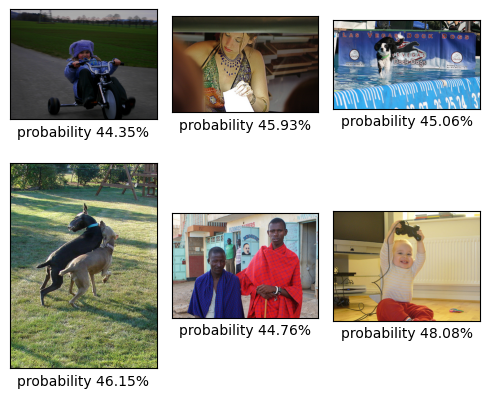

Your request: While holding tight to the ball , the man in red socks is getting tackled .


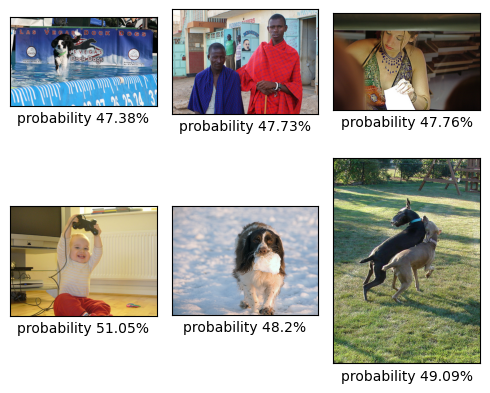

Your request: A dog is dressed in a shirt and pants on the side of the road .


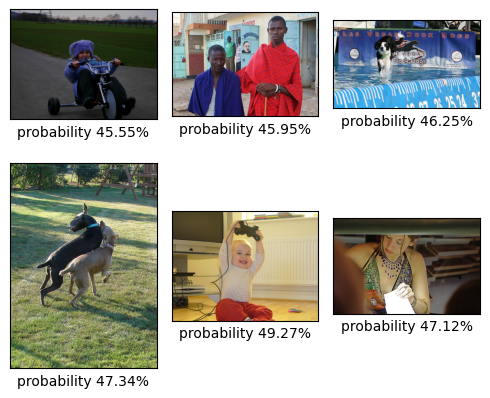

Your request: a biker rides down the street .


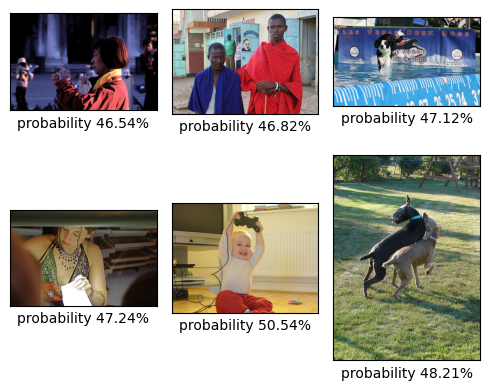

Your request: a kickboxer jumping for a kick


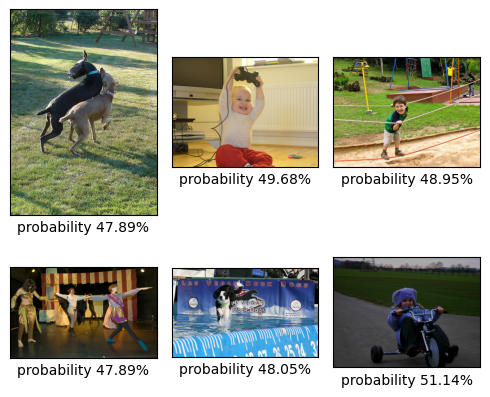

This image is unavailable in your country in compliance with local laws
A young boy wearing a red shirt stands in the street with his arms open wide .
This image is unavailable in your country in compliance with local laws
A woman in purple with two children in the mouth of a cave .
This image is unavailable in your country in compliance with local laws
A little girl dressed in a pink shirt , blue shorts and a pink hair ribbon feeding ducks that are swimming in water .
Your request: a family standing in a rock cave with some of their belongings in the background


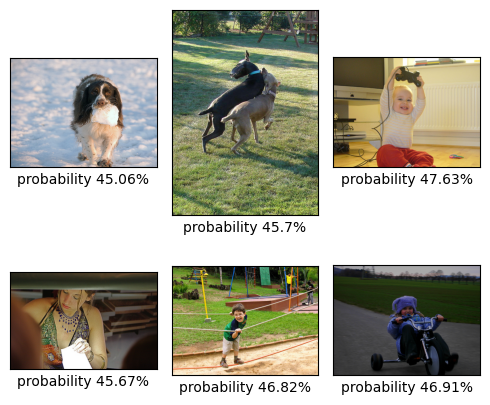

Your request: Three people are looking into photographic equipment .


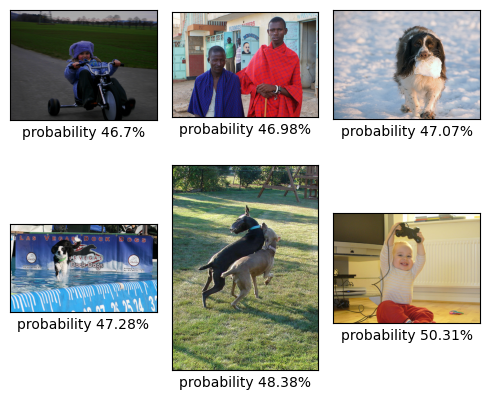

In [47]:
sample = test_query.sample(10, random_state=rs).query_text
for i in range(0, 10):
    show_conforming_images(sample[i:i+1].values[0], WORD_TO_BLOCK)

## Сделайте общий вывод по работе

**загрузка и анализ данных**
В целом наборы данных представлены без дублей.
<br>В большинстве случаев в данных содержатся строковые поля, связываю это с тем, что наборы данных содержат описательную информацию о рассматриваемых объектах.
<br>Загружены данные: `train_dataset`, `test_queries`, `test_images`, `ExpertAnnotations`, `CrowdAnnotations`
<br>train_data содержит строк 5822
<br>data_crowd содержит строк 47830
<br>data_expert содержит строк 5822
<br>test_query содержит строк 500
<br>test_image содержит строк 100
<br>**Количество уникальных объектов в каждом датасете:**
- train_data изображения: 1000 из 5822
- test_query изображения: 100 из 500
- train_data текст: 977 из 5822
- test_query текст: 500 из 500
- data_expert описания: 977 из 5822
- data_crowd описания: 1000 из 47830

<br>На основании графиков определено что, большинство изображений не соответсвует описанию.
<br>**Обработка данных**:
<br>Нормализовал оценки экспертов, в ходе разработки модели принял решение, что для разметки использую эти данные;
<br>Подготовил новый набор данных для обучения моделей, который предполагает использование оценок экспертов.
<br>Для работы с текстами подготовлена функция `vectors_text` преобразующая тексты в векторы используя модель `DistilBERT`, библиотека `Hugging Face Transformers`.
<br>В ходе работы данной функции получен набор данных размером 2427, 768.
<br>Для векторизации графической информации была подготовлена функция `image_vectorization` на основе предобученной модели `resnet50`
<br>В ходе работы данной функции получен набор данных размером 2427, 2048.
<br>**исполнению требования по ограничению обработки изображений**
<br>Создан словарь с словами исключений для удаления текстов из модели.
<br>Отчищен обучающий набор данных от запрещенного контента.
<br>При изучения связи изображений, разметки экспертами и словами исключений, наблюдаю, что если оценка экспертов более 0.1, то более качественные данные получаем на выходе.
<br>**Выводы по обучеию модели**
<br>Для понимания на скоько сильно отличается вероятность корректного описания картинки от вычесленной в значении целевой переменной мной была выбрана метрика для обучения модели-  `RMSE`.
<br>Для создания модели рассмотрел модели `LinearRegression`, `ElasticNet`, `CatBoostRegressor`, `Neural network`, в ходе обучения модели показали результаты
1. LinearRegression 284.92
2. ElasticNet 0.29
3. CatBoostRegressor 0.237
4. Neural network 0.242
<br>В связи с тем, что `RMSE` `CatBoostRegressor` немного лучше, чем у `Neural network` для дальнейших испытаний использовал моедль `CatBoostRegressor`.r<br>**

**Тестирование модели**
<br>При проверке на тестовых данных выбранная модель показала низкое качество. Для более качественной разработки потребуется большее количество ресурсов.
<br>Работу модели можно улучшить, пободрав большее/меньшее количество походящих параметров, найдя их лучешее сочетание.
<br>Возможно нет смысла разрабатывать свои модели, а проще воспользоваться уже предобученными, например `CLIP-ViT` или что-то подобное.

